## Social Networks Final Project

#### By Eli Gnesin
#### Last Updated: April 17, 2022

For this project, I will be examining the NCAA Division 1 Football Bowl Subdivision (FBS) since the creation of the College Football Playoff in 2014. I hope to examine how the teams and conferences have fared in the 8 years since then, as well as if there is anything to be gleaned from individual team networks.

In [1]:
#Import Lines
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import community
import seaborn as sns
import operator
import imageio as iio

### 1. Data Cleaning

I have 8 years of schedules and standings for the FBS, giving me 16 csv files, from which I want to make 2 dataframes (one with all the standings, one with all the schedules), from which I can do network analysis.

In [2]:
columns1=['Rk', 'School', 'Conf', 'W', 'L', 'Pct', 'W.1', 'L.1', 'Pct.1', 'Off','Def', 'SRS', 'SOS', 'AP Pre', 'AP High', 'AP Rank', 'Notes', 'Year']
bigstd = pd.DataFrame()
for c in columns1:
    bigstd[c] = []

columns2=['Rk', 'Wk', 'Date', 'Time', 'Day', 'Winner', 'Pts', 'Unnamed: 7','Loser', 'Pts.1', 'Notes', 'WC', 'LC','Season', 'diff']
bigsch = pd.DataFrame()
for c in columns2:
    bigsch[c] = []

for i in range(2014,2022):

    std = pd.read_csv(f'Stands/{i} Standings.csv', header=0)
    std['Conf'] = std['Conf'].apply(lambda x: ' '.join([i for i in x.split() if '(' not in i]))
    std['Year'] = [i] * len(std)
    
    confdic = {}
    for school, c in zip(std['School'], std['Conf']):
        confdic[school] = c
        
    bigstd = pd.concat([bigstd, std])
    bigstd = bigstd[columns1]
    
    sch = pd.read_csv(f'Scheds/{i} Schedule.csv', header=0)

    sch['Winner'] = sch['Winner'].apply(lambda x: ' '.join(x.split()[1:]) if x[0] == '(' else x)
    sch['Loser'] = sch['Loser'].apply(lambda x: ' '.join(x.split()[1:]) if x[0] == '(' else x)

    dicti = {'Central Florida':'UCF', 'Texas-El Paso':'UTEP', 'Alabama-Birmingham':'UAB',
            'Mississippi': 'Ole Miss', 'Texas-San Antonio':'UTSA', 'Southern Methodist': 'SMU',
            'Southern California':'USC', 'Pittsburgh':'Pitt', 'Louisiana State':'LSU', 'Brigham Young':'BYU'}

    sch['Winner'] = sch['Winner'].apply(lambda x: dicti[x] if x in dicti.keys() else x)
    sch['Loser'] = sch['Loser'].apply(lambda x: dicti[x] if x in dicti.keys() else x)
    
    #print([i for i in sch['Winner'] if i not in std['School']])
    
    sch['WC'] = sch['Winner'].apply(lambda x: confdic[x] if x in confdic.keys() else 'FCS')
    sch['LC'] = sch['Loser'].apply(lambda x: confdic[x] if x in confdic.keys() else 'FCS')
    
    sch['diff'] = sch['Pts'] - sch['Pts.1']
    
    sch['Season'] = [i] * len(sch)
    
    bigsch = pd.concat([bigsch, sch])
    bigsch = bigsch[columns2]

C:\Users\eli\Anaconda3\lib\site-packages\ipykernel_launcher.py:45: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

C:\Users\eli\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [3]:
bigstd

,Rk,School,Conf,W,L,Pct,W.1,L.1,Pct.1,Off,Def,SRS,SOS,AP Pre,AP High,AP Rank,Notes,Year
0,1.0,Florida State,ACC,13.0,1.0,0.929,8.0,0.0,1.000,33.7,25.6,14.48,5.13,1.0,1.0,5.0,NaN,2014.0
1,2.0,Clemson,ACC,10.0,3.0,0.769,6.0,2.0,0.750,30.8,16.7,11.63,2.86,16.0,15.0,15.0,NaN,2014.0
2,3.0,Louisville,ACC,9.0,4.0,0.692,5.0,3.0,0.625,31.2,21.8,10.52,3.22,NaN,20.0,24.0,NaN,2014.0
3,4.0,Boston College,ACC,7.0,6.0,0.538,4.0,4.0,0.500,26.2,21.3,6.04,2.35,NaN,NaN,NaN,NaN,2014.0
4,5.0,North Carolina State,ACC,8.0,5.0,0.615,3.0,5.0,0.375,30.2,27.0,4.17,1.25,NaN,NaN,NaN,NaN,2014.0
5,6.0,Syracuse,ACC,3.0,9.0,0.250,1.0,7.0,0.125,17.1,24.3,-4.84,3.00,NaN,NaN,NaN,NaN,2014.0
6,7.0,Wake Forest,ACC,3.0,9.0,0.250,1.0,7.0,0.125,14.8,26.4,-7.64,1.61,NaN,NaN,NaN,NaN,2014.0
7,8.0,Georgia Tech,ACC,11.0,3.0,0.786,6.0,2.0,0.750,37.9,25.7,15.92,4.78,NaN,8.0,8.0,NaN,2014.0
8,9.0,Duke,ACC,9.0,4.0,0.692,5.0,3.0,0.625,32.4,21.8,6.64,-0.82,NaN,19.0,NaN,NaN,2014.0
9,10.0,North Carolina,ACC,6.0,7.0,0.462,4.0,4.0,0.500,33.2,39.0,0.14,4.29,23.0,21.0,NaN,NaN,2014.0


In [4]:
print(bigsch.shape)
bigsch

(6715, 15)


,Rk,Wk,Date,Time,Day,Winner,Pts,Unnamed: 7,Loser,Pts.1,Notes,WC,LC,Season,diff
0,1.0,1.0,Aug 27 2014,7:00 PM,Wed,Georgia State,38.0,NaN,Abilene Christian,37.0,NaN,Sun Belt,FCS,2014.0,1.0
1,2.0,1.0,Aug 28 2014,7:00 PM,Thu,Akron,41.0,NaN,Howard,0.0,NaN,MAC,FCS,2014.0,41.0
2,3.0,1.0,Aug 28 2014,10:30 PM,Thu,Arizona State,45.0,NaN,Weber State,14.0,NaN,Pac-12,FCS,2014.0,31.0
3,4.0,1.0,Aug 28 2014,7:00 PM,Thu,Central Michigan,20.0,NaN,Chattanooga,16.0,NaN,MAC,FCS,2014.0,4.0
4,5.0,1.0,Aug 28 2014,7:02 PM,Thu,Louisiana-Monroe,17.0,NaN,Wake Forest,10.0,NaN,Sun Belt,ACC,2014.0,7.0
5,6.0,1.0,Aug 28 2014,7:00 PM,Thu,Minnesota,42.0,NaN,Eastern Illinois,20.0,NaN,Big Ten,FCS,2014.0,22.0
6,7.0,1.0,Aug 28 2014,8:00 PM,Thu,Ole Miss,35.0,N,Boise State,13.0,Georgia Dome - Atlanta GA,SEC,MWC,2014.0,22.0
7,8.0,1.0,Aug 28 2014,8:00 PM,Thu,New Mexico State,28.0,NaN,Cal Poly,10.0,NaN,Sun Belt,FCS,2014.0,18.0
8,9.0,1.0,Aug 28 2014,7:00 PM,Thu,Northern Illinois,55.0,NaN,Presbyterian,3.0,NaN,MAC,FCS,2014.0,52.0
9,10.0,1.0,Aug 28 2014,10:00 PM,Thu,Rutgers,41.0,N,Washington State,38.0,CenturyLink Field - Seattle WA,Big Ten,Pac-12,2014.0,3.0


### 1. Graphing and Visualization

In [5]:
G = nx.from_pandas_edgelist(bigsch,
                            source='Loser',
                            target='Winner',
                            edge_attr=True, #Every column other than source and target is in an attribute dictionary
                            create_using=nx.DiGraph(),
                           )

In [ ]:
playoff_teams = [['Alabama', 'Oregon', 'Florida State', 'Ohio State'],
                ['Clemson', 'Alabama', 'Michigan State', 'Oklahoma'],
                ['Alabama', 'Clemson', 'Ohio State', 'Washington'],
                ['Clemson', 'Oklahoma', 'Georgia', 'Alabama'],
                ['Alabama', 'Clemson', 'Notre Dame', 'Oklahoma'],
                ['LSU', 'Ohio State', 'Clemson', 'Oklahoma'],
                ['Alabama','Clemson', 'Ohio State','Notre Dame'],
                ['Alabama', 'Michigan','Georgia','Cincinnati']]


for i in range(2014,2022):
    
    #q = len(bigsch[bigsch['Season'] == float(i)])  #Find how many games were played in the subset
    
    #edgelist = [e for e in G.edges(data=True) if e[2]['Season'] == float(i)] #Take only the edges we want to have
    
    #Add each node and edge we want one by one
#    dig = nx.DiGraph()
#    dig2 = nx.Graph()
#    for node in G.nodes():
#        dig.add_node(node)
#        dig2.add_node(node)
#    for edge in edgelist:
#        dig.add_edge(edge[0], edge[1], weight=(edge[2]['Pts'] - edge[2]['Pts.1']))
#        dig2.add_edge(edge[0], edge[1], weight=(edge[2]['Pts'] - edge[2]['Pts.1']))

    dig = nx.from_pandas_edgelist(bigsch[bigsch['Season'] == float(i)],
                                 source = 'Loser',
                                 target = 'Winner',
                                 edge_attr = True,
                                 create_using = nx.DiGraph(),
                                 )
    dig2 = nx.from_pandas_edgelist(bigsch[bigsch['Season'] == float(i)],
                                 source = 'Loser',
                                 target = 'Winner',
                                 edge_attr = True,
                                 )
    
    pos = nx.shell_layout(dig, [[n for n in dig.nodes() if 10>dig.degree(n)], [n for n in dig.nodes() if 10<=dig.degree(n)]])
    
    colors = []
    for n in dig.nodes():
        if n in playoff_teams[i-2014]:
            colors.append('pink')
        elif dig.degree(n) <=3:
            colors.append('Gold')
        else:
            colors.append('lightblue')
    
    plt.figure(figsize = (20,20))
    nx.draw(dig, pos,
            node_size = [dig.degree(n) * 50 for n in dig.nodes()], # node size based on weighted degree 
            node_color=colors, 
            cmap=plt.cm.Spectral, # node color for categorical data set random color based on whatever color map
            connectionstyle='arc3,rad=0.2', # you can make curved lines with this
            arrowstyle ='simple', # you change arrow and line style with this
            arrowsize = 10, # adjust the size of the arrows for visibility
            edge_cmap = plt.cm.Greys, # use a color map 
            #edge_color=[float(d['Pts'] - d['Pts.1'])**.1 for _, _, d in edgelist],
            edge_color=[float(d['diff'])**.1 for _, _, d in dig.edges(data=True)],
            labels = dict([(label,label.replace(' ','\n')) for label in dig.nodes()]),
            font_size = 8)
    plt.title(f'{i}', fontsize=18, pad=-20)
    plt.savefig(f'Teams{i}.png', bbox_to_inches='tight')
    plt.show()

    print(f'The network size of G is {dig.size()}')
    print(f'The density of G is {nx.density(dig)}')
    print(f'There are {nx.number_connected_components(dig2)} Connected Components in G')

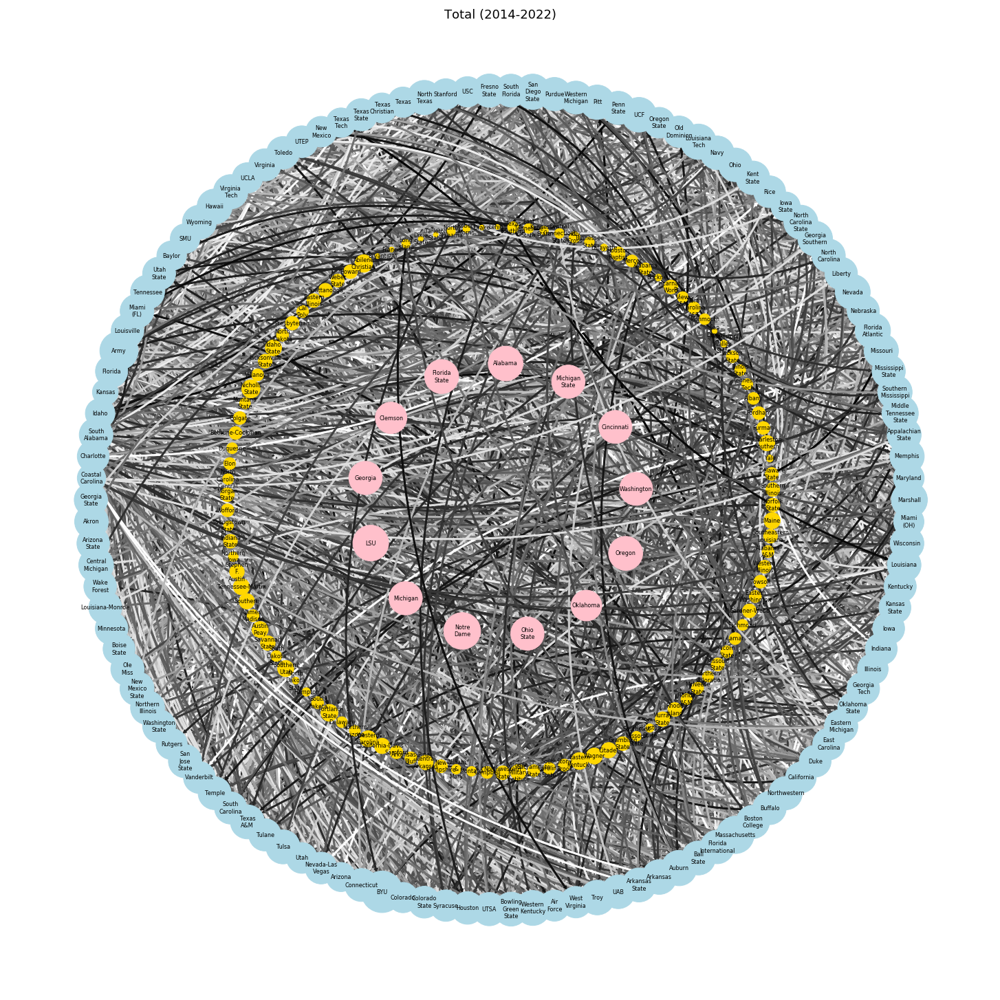

The network size of G is 3360
The density of G is 0.058091286307053944


In [7]:
#Overall Schedule network for all 8 seasons together
playsch = ['Alabama', 'Clemson', 'LSU', 'Ohio State', 'Oklahoma',
          'Georgia', 'Michigan', 'Cincinnati', 'Florida State',
          'Washington', 'Michigan State', 'Oregon', 'Notre Dame']

colors = []
for n in G.nodes():
    if n in playsch:
        colors.append('pink')
    elif G.degree(n) <=15:
        colors.append('Gold')
    else:
        colors.append('lightblue')

pos = nx.shell_layout(G, [[n for n in G.nodes() if n in playsch], [n for n in G.nodes() if 15>=G.degree(n)], [n for n in G.nodes() if ((G.degree(n) > 15) & (n not in playsch))]])

plt.figure(figsize = (20,20))
nx.draw(G, pos,
        node_size = [G.degree(n) * 50 for n in G.nodes()], # node size based on weighted degree 
        node_color=colors, 
        cmap=plt.cm.Spectral, # node color for categorical data set random color based on whatever color map
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 10, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.Greys, # use a color map 
        #edge_color=[float(d['Pts'] - d['Pts.1'])**.1 for _, _, d in edgelist],
        edge_color=[float(d['diff'])**.1 for _, _, d in G.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in G.nodes()]),
        font_size = 8)
plt.title(f'Total (2014-2022)', fontsize=18, pad=-20)
plt.savefig(f'Teamsoverall.png', bbox_to_inches='tight')
plt.show()

print(f'The network size of G is {G.size()}')
print(f'The density of G is {nx.density(G)}')

In [8]:
#Turning images into a Gif
images = []
for i in range(2014,2022):
    images.append(iio.imread(f'Teams{int(i)}.png'))
images.append(iio.imread('Teamsoverall.png'))
kargs = {'duration':0.75}
iio.mimsave('Teams1.gif', images, **kargs)

### 3. Centrality

In order to answer the question of "Which is the most important team in the FBS in the CFP era?", we can take the approach of looking at centrality measures from the overall graph including all 6715 games in the big schedule. In this sense, teams with high centrality scores are "important" in different ways to the overall FBS landscape in the era.

{'BYU': 0.30416666666666664, 'Army': 0.2583333333333333, 'Massachusetts': 0.24583333333333332, 'Notre Dame': 0.2375, 'Middle Tennessee State': 0.23333333333333334}


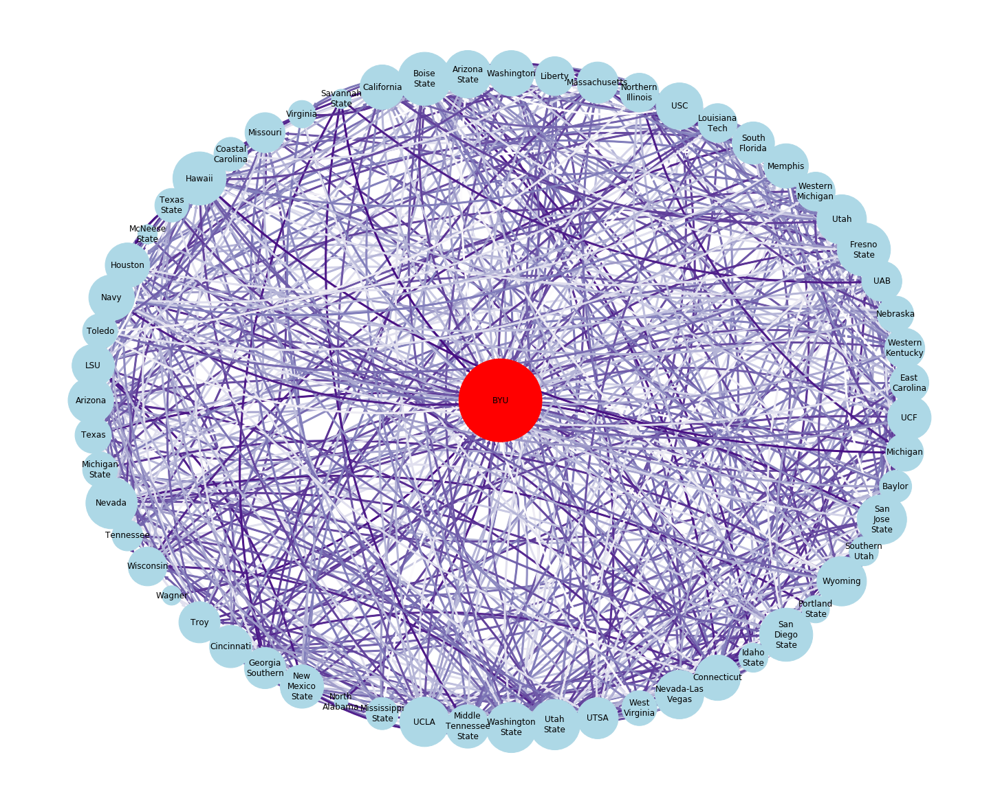

In [9]:
#Degree Centrality
dc = nx.degree_centrality(G)

#Five highest schools
print(dict(sorted(dc.items(), key = operator.itemgetter(1), reverse = True)[:5]))

#The highest degree centrality is BYU (This makes sense cause BYU is independent, the top 4 teams here are)
ego_dc = nx.ego_graph(G, 'BYU', undirected=True)
plt.figure(figsize = (20,16))
nx.draw(ego_dc, pos = nx.shell_layout(ego_dc, [['BYU'], [i for i in ego_dc.nodes() if i != 'BYU']]),  
        with_labels=True,
        node_size = [ego_dc.degree(n) * 200 for n in ego_dc.nodes()],
        node_color = ['r' if n == 'BYU' else 'lightblue' for n in ego_dc.nodes()],
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 10, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.Purples, # use a color map 
        edge_color=[float(d['diff'])**.1 for _, _, d in ego_dc.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in ego_dc.nodes()]),
        font_size = 12)
#plt.savefig('degree.png')
plt.show()

{'Army': 0.026878181477414297, 'BYU': 0.02603878846906814, 'Massachusetts': 0.0202786476093516, 'San Diego State': 0.015842269255049293, 'Connecticut': 0.014310505085180949}


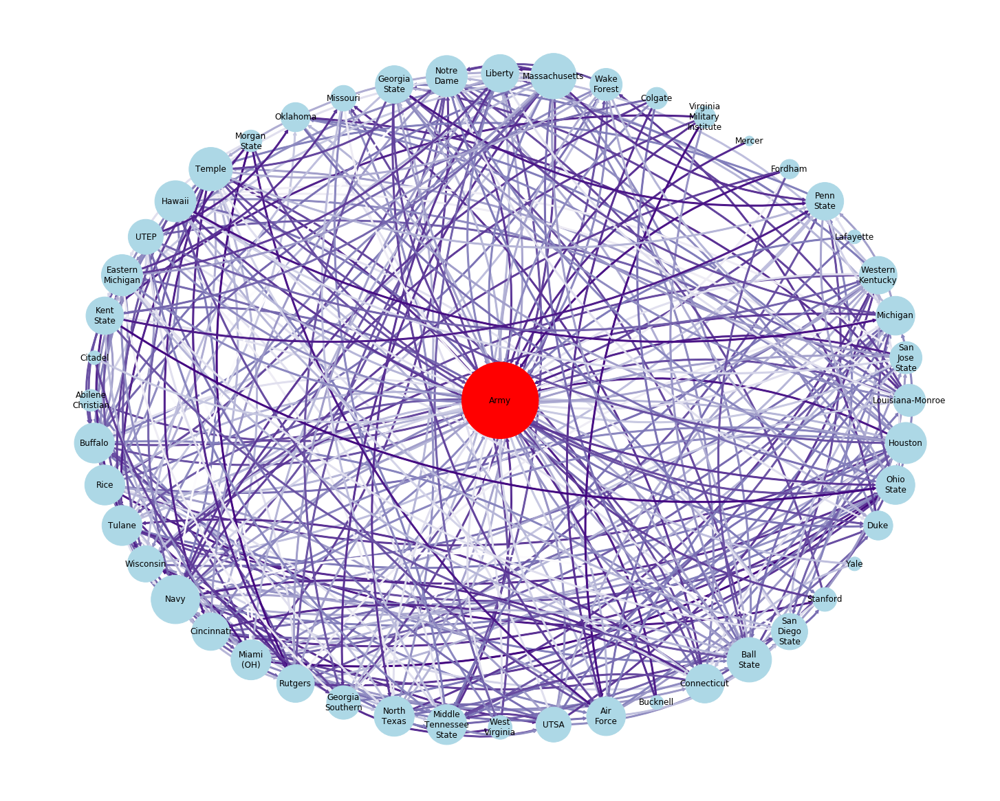

In [10]:
#Betweenness Centrality
bc = nx.betweenness_centrality(G)

#Five highest schools
print(dict(sorted(bc.items(), key = operator.itemgetter(1), reverse = True)[:5]))

#The highest betweenness centrality is Army
ego_bc = nx.ego_graph(G, 'Army', undirected=True)
plt.figure(figsize = (20,16))
nx.draw(ego_bc, pos = nx.shell_layout(ego_bc, [['Army'], [i for i in ego_bc.nodes() if i != 'Army']]), 
        with_labels=True,
        node_size = [ego_bc.degree(n) * 200 for n in ego_bc.nodes()],
        node_color = ['r' if n == 'Army' else 'lightblue' for n in ego_bc.nodes()],
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 10, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.Purples, # use a color map 
        edge_color=[float(d['diff'])**.1 for _, _, d in ego_bc.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in ego_bc.nodes()]),
        font_size = 12)
#plt.savefig('betweenness.png')
plt.show()

{'BYU': 0.5175804093567251, 'Alabama': 0.5086566091954023, 'LSU': 0.5043091168091168, 'Notre Dame': 0.5043091168091168, 'Ohio State': 0.5032338308457712}


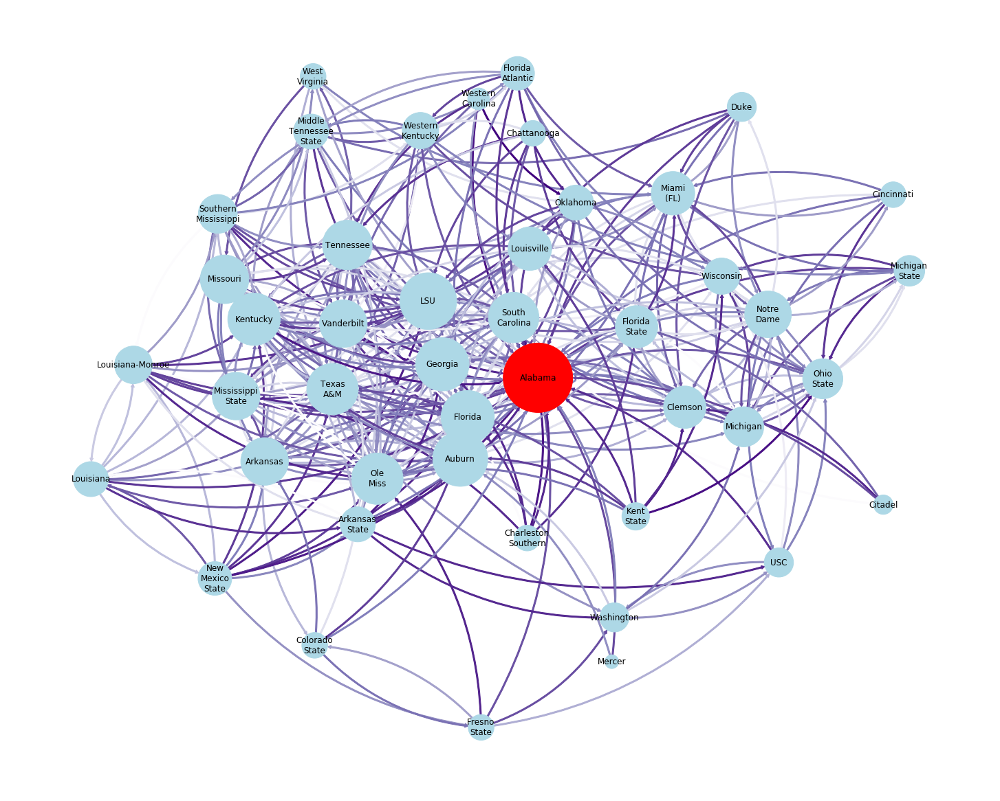

In [11]:
#Closeness Centrality
cc = nx.closeness_centrality(G)

#Five highest schools
print(dict(sorted(cc.items(), key = operator.itemgetter(1), reverse = True)[:5]))

#The highest closeness centrality is BYU, so we'll do a 1.5 degree ego network of Alabama (the #2 school)
ego_cc = nx.ego_graph(G, 'Alabama', undirected=True)
plt.figure(figsize = (20,16))
nx.draw(ego_cc, pos = nx.kamada_kawai_layout(ego_cc), with_labels=True,
        node_size = [ego_cc.degree(n) * 200 for n in ego_cc.nodes()],
        node_color = ['r' if n == 'Alabama' else 'lightblue' for n in ego_cc.nodes()],
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 10, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.Purples, # use a color map 
        edge_color=[float(d['diff'])**.1 for _, _, d in ego_cc.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in ego_cc.nodes()]),
        font_size = 12)
#plt.savefig('closeness.png')
plt.show()

{'Alabama': 0.2036033283095494, 'Ohio State': 0.17879161563872104, 'Notre Dame': 0.1735481996569821, 'LSU': 0.1653483600021611, 'BYU': 0.15680015678408601}


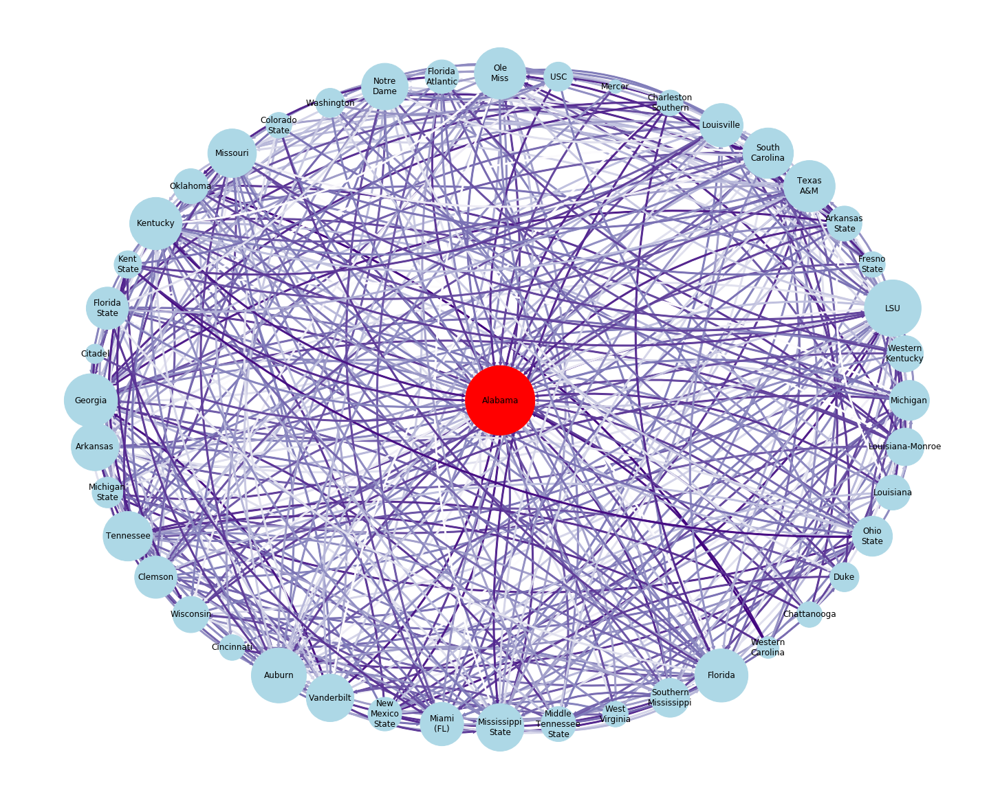

In [12]:
#Eigenvector Centrality
ec = nx.eigenvector_centrality(G)

#Five highest schools
print(dict(sorted(ec.items(), key = operator.itemgetter(1), reverse = True)[:5]))

#The highest eigenvector centrality is Baylor, so we'll do a 1.5 degree ego network of Baylor
ego_ec = nx.ego_graph(G, 'Alabama', undirected=True)
plt.figure(figsize = (20,16))
nx.draw(ego_ec, pos = nx.shell_layout(ego_ec, [['Alabama'], [i for i in ego_ec.nodes() if i != 'Alabama']]), 
        with_labels=True,
        node_size = [ego_ec.degree(n) * 200 for n in ego_ec.nodes()],
        node_color = ['r' if n == 'Alabama' else 'lightblue' for n in ego_ec.nodes()],
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 10, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.Purples, # use a color map 
        edge_color=[float(d['diff'])**.1 for _, _, d in ego_ec.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in ego_ec.nodes()]),
        font_size = 12)
#plt.savefig('eigenvector.png')
plt.show()

In [13]:
#I want to make a small dataframe for centrality measures by school and conference
#This is going on the results 
centm = pd.DataFrame()
centm[''] = ['Team #1', 'Team #2', 'Team #3']
centm = centm.set_index('')
for i in ['Degree', 'Betweenness', 'Closeness', 'Eigenvector']:
    centm[i] = [0] * 3
    
for j in range(0,3):
    m = []
    for i in [dc, bc, cc, ec]:
        m.append(list(dict(sorted(i.items(), key = operator.itemgetter(1), reverse = True)[:5]).keys())[j])
    centm.loc[f'Team #{j+1}'] = m

centm

,Degree,Betweenness,Closeness,Eigenvector
,,,,
Team #1,BYU,Army,BYU,Alabama
Team #2,Army,BYU,Alabama,Ohio State
Team #3,Massachusetts,Massachusetts,LSU,Notre Dame


In [14]:
#I want to compare the average centrality scores by each metric for playoff vs. non-playoff teams

#There are 13 schools that have made the playoff
playsch = ['Alabama', 'Clemson', 'LSU', 'Ohio State', 'Oklahoma',
          'Georgia', 'Michigan', 'Cincinnati', 'Florida State',
          'Washington', 'Michigan State', 'Oregon', 'Notre Dame']

centn = pd.DataFrame()
centn[''] = ['Playoff', 'Non-Playoff']
centn = centn.set_index('')
for i in ['Degree', 'Betweenness', 'Closeness', 'Eigenvector']:
    centn[i] = [0] * 2
    
p = []
np = []
for c in [dc, bc, cc, ec]:
    p.append(sum([c[i[0]] for i in c.items() if i[0] in playsch])/len([c[i[0]] for i in c.items() if i[0] in playsch]))
    np.append(sum([c[i[0]] for i in c.items() if i[0] not in playsch])/len([c[i[0]] for i in c.items() if i[0] not in playsch]))
centn.loc['Playoff'] = p
centn.loc['Non-Playoff'] = np
centn

,Degree,Betweenness,Closeness,Eigenvector
,,,,
Playoff,0.199359,0.005079,0.481904,0.139301
Non-Playoff,0.111440,0.004324,0.289716,0.038558


### 3. Conferences!

In [ ]:
#I want to make an adjacency matrix, where the weights is conference record vs other conference

#Colors for conferences in nodes
confcolors = ['lightblue', 'lightblue','orange', 'orange', 'lightblue', 
              'lightblue', 'lightblue', 'lightblue', 'orange', 
              'lightblue', 'gold', 'lightblue']

for year in bigsch['Season'].unique():
    
    cols = ['Conference'] + list(bigsch['WC'].unique())
    adjmatrix = pd.DataFrame()
    adjmatrix = adjmatrix.reindex(adjmatrix.columns.union(cols), axis=1)
    adjmatrix.columns = cols
    adjmatrix['Conference'] = list(bigsch['WC'].unique())
    adjmatrix.fillna(0, inplace=True)
    adjmatrix = adjmatrix.set_index('Conference')
    
    i = 0
    for game in list(bigsch[bigsch['Season'] == year].values):
        a = game[11]
        b = game[12]
        if a != b:
            adjmatrix[b].loc[a] += 1
        i = i+1
    print(i)
        
    G = nx.from_pandas_adjacency(adjmatrix, create_using=nx.DiGraph())
    
    plt.figure(figsize = (12,12))
    nx.draw_circular(G,
        node_size = [G.degree(n) * 250 for n in G.nodes()], # node size based on weighted degree from edge weight attribute add scale factor 
        node_color=confcolors, 
        cmap=plt.cm.Spectral, # node color for categorical data set random color based on whatever color map
        connectionstyle='arc3,rad=0.2', # you can make curved lines with this
        arrowstyle ='simple', # you change arrow and line style with this
        arrowsize = 16, # adjust the size of the arrows for visibility
        edge_cmap = plt.cm.BuPu, # use a color map 
        edge_color=[float(d['weight']) for _, _, d in G.edges(data=True)],
        labels = dict([(label,label.replace(' ','\n')) for label in G.nodes()]),
        font_size = 10)
    
    plt.title(f'{int(year)}', fontsize=16, pad=-20)
    plt.savefig(f'{int(year)}conferences.png', bbox_to_inches='tight')
    plt.show()

6715


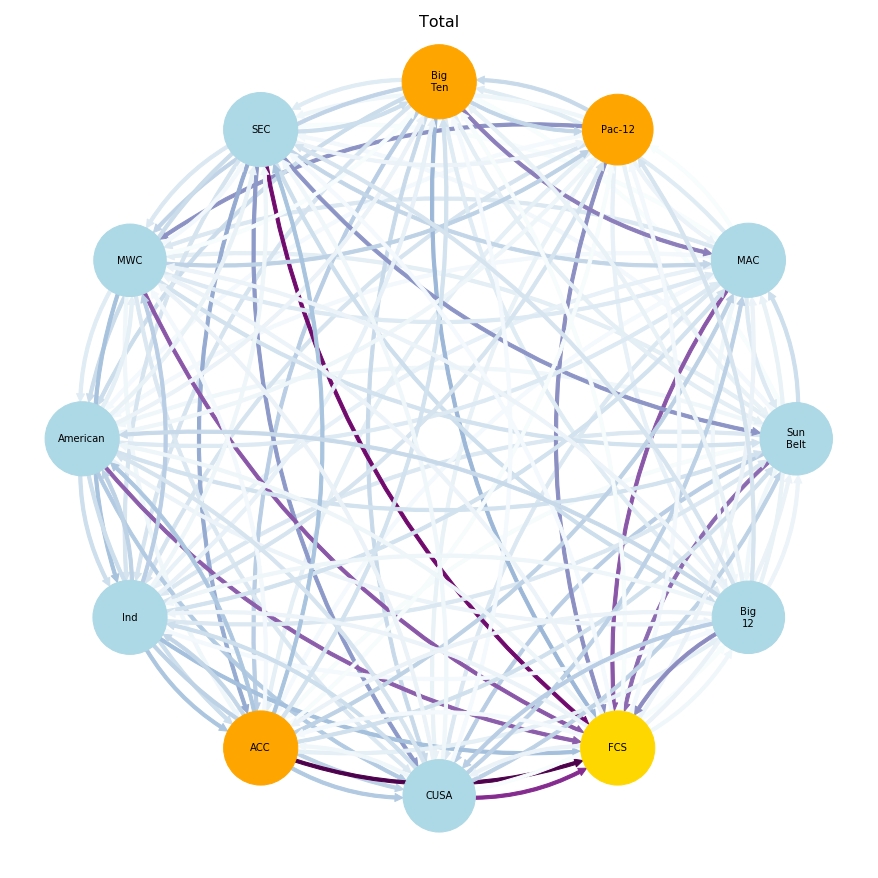

In [16]:
cols = ['Winner'] + list(bigsch['WC'].unique())
adjmatrix = pd.DataFrame()
adjmatrix = adjmatrix.reindex(adjmatrix.columns.union(cols), axis=1)
adjmatrix.columns = cols
adjmatrix['Winner'] = list(bigsch['WC'].unique())
adjmatrix.fillna(0, inplace=True)
adjmatrix = adjmatrix.set_index('Winner')

i = 0
for game in list(bigsch.values):
    a = game[11]
    b = game[12]
    if a != b:
        adjmatrix[b].loc[a] += 1
    i = i+1
print(i)

G = nx.from_pandas_adjacency(adjmatrix, create_using=nx.DiGraph())

plt.figure(figsize = (12,12))
nx.draw_circular(G,
    node_size = [G.degree(n) * 250 for n in G.nodes()], # node size based on weighted degree from edge weight attribute add scale factor 
    node_color=confcolors, 
    cmap=plt.cm.Spectral, # node color for categorical data set random color based on whatever color map
    connectionstyle='arc3,rad=0.2', # you can make curved lines with this
    arrowstyle ='simple', # you change arrow and line style with this
    arrowsize = 16, # adjust the size of the arrows for visibility
    edge_cmap = plt.cm.BuPu, # use a color map 
    edge_color=[float(d['weight']) for _, _, d in G.edges(data=True)],
    labels = dict([(label,label.replace(' ','\n')) for label in G.nodes()]),
    font_size = 10)

plt.title('Total', fontsize=16, pad=-20)
plt.savefig('Conferences.png', bbox_to_inches='tight')
plt.show()

In [17]:
for col in adjmatrix.columns:
    adjmatrix[col] = adjmatrix[col].apply(lambda x: int(x))
adjmatrix

,Sun Belt,MAC,Pac-12,Big Ten,SEC,MWC,American,Ind,ACC,CUSA,FCS,Big 12
Winner,,,,,,,,,,,,
Sun Belt,0,21,0,1,4,12,5,16,2,29,65,5
MAC,15,0,1,14,1,16,4,10,3,16,71,5
Pac-12,9,7,0,23,5,53,3,18,11,9,54,10
Big Ten,12,59,25,0,14,26,22,18,29,23,41,14
SEC,52,25,7,21,0,16,22,18,45,51,94,21
MWC,19,15,27,1,4,0,14,36,5,16,71,0
American,19,15,6,8,9,11,0,21,21,31,69,7
Ind,16,19,18,10,6,29,27,0,34,27,37,3
ACC,20,27,2,19,35,4,33,25,0,32,103,11


In [18]:
#Turning images into a Gif
images = []
for i in range(2014,2022):
    images.append(iio.imread(f'{int(i)}conferences.png'))
images.append(iio.imread('Conferences.png'))
kargs = {'duration':0.75}
iio.mimsave('Conferences1.gif', images, **kargs)